In [1]:
import pandas as pd
import requests
import json
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Electric Vehicle Forecasting

One of the core problems in public policy on transportation and utility netowkrs is the problem of how to forecast the uptake of electric vehicles, and how that uptake will interact with the infrastructure for electric vehicles. This project attempts to look at the features of electric vehicle uptake, using the extremely detailed data from the Washingston State Department of Licensing's electric vehicle registry. This data records both the makes, models, and model years, and also records when these were purchased. The census tract is also included; so the plan of this analysis is to use predictive modeling to match particular census features to electric vehicle counts. For these purposes, I pull from the 5 year ACS 2022 data, grabbing a bunch of interrelated demographic, social, economic, and transportation features to use as a dataset to find a useful and predictive machine learning model.

This type of project is a regression project; the project looks at the ways that different types of features interact with the electric vehicle count in a census tract. 

# Datasets Used

- Washington State Department of Licensing, 2024. Electric Vehicle Population Data. https://data.wa.gov/Transportation/Electric-Vehicle-Population-Data/f6w7-q2d2/about_data
- Washington State Department of Licensing, 2024. Electric Vehicle Title and Registration Activity. https://data.wa.gov/Transportation/Electric-Vehicle-Title-and-Registration-Activity/rpr4-cgyd/about_data
- Census data tables, ACS 5 year 2022, Tables DP02, DP03, B08201

# Data Loading and Cleaning

The datasets made use of here are the Washington State Department of Licensing's electric vehicle population data, the vehicle title and registration activity, and census data.

This section takes all of the data associated with electric vehicle registration and cleans it to create a simple count dataset for 2024 in terms of how many electric vehicles are in a census tract. 

In [2]:
pop = pd.read_csv('Electric_Vehicle_Population_Data_20240124.csv')

Electric Vehicle Population Info

In [3]:
pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166800 entries, 0 to 166799
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         166800 non-null  object 
 1   County                                             166795 non-null  object 
 2   City                                               166795 non-null  object 
 3   State                                              166800 non-null  object 
 4   Postal Code                                        166795 non-null  float64
 5   Model Year                                         166800 non-null  int64  
 6   Make                                               166800 non-null  object 
 7   Model                                              166800 non-null  object 
 8   Electric Vehicle Type                              166800 non-null  object

In [4]:
reg = pd.read_csv("Electric_Vehicle_Title_and_Registration_Activity_20240124.csv")

Vehicle Registration Info

In [115]:
reg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 899088 entries, 0 to 899087
Data columns (total 35 columns):
 #   Column                                                          Non-Null Count   Dtype  
---  ------                                                          --------------   -----  
 0   Clean Alternative Fuel Vehicle Type                             899088 non-null  object 
 1   VIN (1-10)                                                      899088 non-null  object 
 2   DOL Vehicle ID                                                  899088 non-null  int64  
 3   Model Year                                                      899088 non-null  int64  
 4   Make                                                            899088 non-null  object 
 5   Model                                                           899088 non-null  object 
 6   Vehicle Primary Use                                             899088 non-null  object 
 7   Electric Range                        

In [5]:
reg['DOL Transaction Date'] = pd.to_datetime(reg['DOL Transaction Date'])
#convert transaction date to date time

In [6]:
reg = reg.sort_values(by = ['DOL Vehicle ID', 'DOL Transaction Date'], ascending=[True, False])
# sort values by transaction date

In [7]:
reg = reg[reg['Transaction Type'] == 'Original Registration'].drop_duplicates(subset='DOL Vehicle ID', keep='last')
# drop duplicates and filter out all but the first registrations--for my purposes an ev is an ev

In [8]:
reg = reg[reg['Transaction Type'] == 'Original Registration'].drop_duplicates(subset='DOL Vehicle ID', keep='first')
# drop duplicates and filter out all but the first registrations--for my purposes an ev is an ev

In [9]:
population = pd.merge(pop, reg[['DOL Vehicle ID', 'Vehicle Primary Use', 
       'Odometer Reading', 'Odometer Code', 'New or Used Vehicle',
       'Sale Price', 'Sale Date', 'Transaction Type',
       'DOL Transaction Date', 'Transaction Year', 
       'State of Residence', 
       '2015 HB 2778 Exemption Eligibility',
       '2019 HB 2042 Clean Alternative Fuel Vehicle (CAFV) Eligibility',
       'Meets 2019 HB 2042 Electric Range Requirement',
       'Meets 2019 HB 2042 Sale Date Requirement',
       'Meets 2019 HB 2042 Sale Price/Value Requirement',
       '2019 HB 2042: Battery Range Requirement',
       '2019 HB 2042: Purchase Date Requirement',
       '2019 HB 2042: Sale Price/Value Requirement',
       'Electric Vehicle Fee Paid', 'Transportation Electrification Fee Paid',
       'Hybrid Vehicle Electrification Fee Paid']], on = 'DOL Vehicle ID', how = 'left')
# merge the unique columns of registration and population, this dataset is helpful for doing some time series forecasts later on

In [10]:
counts = pd.DataFrame(population.groupby(['2020 Census Tract']).count()['VIN (1-10)'])
# making a counts dataframe to use

In [11]:
counts = counts.reset_index()

In [12]:
counts['2020 Census Tract'] = counts['2020 Census Tract'].astype(str)
population['2020 Census Tract'] = population['2020 Census Tract'].astype(str)

In [13]:
counts = pd.merge(counts, population[['2020 Census Tract', 'County', 'State']], on = '2020 Census Tract', how = 'inner').drop_duplicates()
# adding a county and state variable to this

In [14]:
counts = counts[counts['State'] == 'WA']
#cleaning out all the things registered in different states

# loading in census data and cleaning it 

This section loads a bunch of census data and cleans out the weird bits, and makes it useful for modeling purposes. Some issues with the census tract data are as follows: too many nas, lots of redundant data columns, use of percentage and margin, which can be replaced by totals, and lots of strange headings. By getting rid of these, we should have a pretty useful and helpful dataset. 

In [117]:
dp03 = pd.read_csv('ACSDP5Y2022.DP03-Data.csv')
# read in the Detailed Tables 3 Census on Economic data, pulled for each census tract in Washington

C:\Users\hilar\AppData\Local\Temp\ipykernel_8644\3435977864.py:1: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,128,129,132,133,136,137,140,141,144,145,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,178,179,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,276,290,294,302,306,310,326,338,366,376,424,452,464,474,478,480,482,492,502) have mixed types. Specify dtype option on import or set low_memory=False.
  dp03 = pd.read_csv('ACSDP5Y2022.DP03-Data.csv')


In [119]:
dp03.columns = dp03.iloc[0]
# make the columns the verbose headings

In [120]:
dp03 = dp03.iloc[1:]
#get rid of weird census headings

In [121]:
dp03 = dp03[dp03.columns[dp03.columns.notna()]]

In [122]:
dp03 = dp03[dp03.columns[~dp03.columns.str.contains('Margin|Percent|PERCENTAGE')]]
# cut out the margin and percentage columns

In [123]:
dp03['Geography'] = dp03['Geography'].str.replace('1400000US', '').astype(float).astype(str)
#correlate this with the original dataset

In [124]:
dp03 = dp03.drop('Geographic Area Name', axis =1)

In [125]:
dp03.columns = dp03.columns.str.replace('Estimate!!', '').str.replace('!!', '-')

In [126]:
dp03.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1784 entries, 1 to 1784
Columns: 119 entries, Geography to HEALTH INSURANCE COVERAGE-Civilian noninstitutionalized population 19 to 64 years-Not in labor force:-No health insurance coverage
dtypes: object(119)
memory usage: 1.6+ MB


In [23]:
dp03 = dp03.replace('(X)', np.nan)
dp03 = dp03.replace('-', np.nan)
dp03 = dp03.replace('N', np.nan)
#replacing the weird nas with other nas

In [24]:
dp03 = dp03.drop(['EMPLOYMENT STATUS-Population 16 years and over',  'COMMUTING TO WORK-Workers 16 years and over','OCCUPATION-Civilian employed population 16 years and over','INDUSTRY-Civilian employed population 16 years and over', 'CLASS OF WORKER-Civilian employed population 16 years and over', 'INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households', 'INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Families', 'HEALTH INSURANCE COVERAGE-Civilian noninstitutionalized population'], axis =1)
#data has some totals, where everything in a category adds up to this, which will not work well with modeling, so going to drop that here

In [127]:
# we are going to speed run the same process for DP02, social data
dp02 = pd.read_csv('ACSDP5Y2022.DP02-Data.csv')
dp02.columns = dp02.iloc[0]
# make the columns the verbose headings
dp02 = dp02.iloc[1:]
#get rid of weird census headings
dp02 = dp02[dp02.columns[dp02.columns.notna()]]
dp02 = dp02[dp02.columns[~dp02.columns.str.contains('Margin|Percent|PERCENTAGE|ANCESTRY')]]
# cut out the margin and percentage columns, also ancestry, because it is not necessarily going to give us much to work off of
dp02['Geography'] = dp02['Geography'].str.replace('1400000US', '').astype(float).astype(str)
#correlate this with the original dataset
dp02 = dp02.drop('Geographic Area Name', axis =1)
dp02.columns = dp02.columns.str.replace('Estimate!!', '').str.replace('!!', '-')
dp02 = dp02.replace('(X)', np.nan)
dp02 = dp02.replace('-', np.nan)
dp02 = dp02.replace('N', np.nan)
#replacing the weird nas with other nas

C:\Users\hilar\AppData\Local\Temp\ipykernel_8644\315558949.py:2: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,

In [128]:
dp02.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1784 entries, 1 to 1784
Columns: 127 entries, Geography to COMPUTERS AND INTERNET USE-Total households-With a broadband Internet subscription
dtypes: object(127)
memory usage: 1.7+ MB


In [26]:
dp02 = dp02.drop(['HOUSEHOLDS BY TYPE-Total households','RELATIONSHIP-Population in households', 'MARITAL STATUS-Males 15 years and over', 'MARITAL STATUS-Females 15 years and over', 'SCHOOL ENROLLMENT-Population 3 years and over enrolled in school',  'EDUCATIONAL ATTAINMENT-Population 25 years and over', 'VETERAN STATUS-Civilian population 18 years and over', 'DISABILITY STATUS OF THE CIVILIAN NONINSTITUTIONALIZED POPULATION-Total Civilian Noninstitutionalized Population', 'RESIDENCE 1 YEAR AGO-Population 1 year and over', 'PLACE OF BIRTH-Total population', 'U.S. CITIZENSHIP STATUS-Foreign-born population','YEAR OF ENTRY-Population born outside the United States',
 'YEAR OF ENTRY-Population born outside the United States-Native',
 'YEAR OF ENTRY-Population born outside the United States-Native-Entered 2010 or later',
 'YEAR OF ENTRY-Population born outside the United States-Native-Entered before 2010',
 'YEAR OF ENTRY-Population born outside the United States-Foreign born',
 'YEAR OF ENTRY-Population born outside the United States-Foreign born-Entered 2010 or later',
 'YEAR OF ENTRY-Population born outside the United States-Foreign born-Entered before 2010',
 'WORLD REGION OF BIRTH OF FOREIGN BORN-Foreign-born population, excluding population born at sea', 'LANGUAGE SPOKEN AT HOME-Population 5 years and over','COMPUTERS AND INTERNET USE-Total households'], axis =1)
#data has some totals, where everything in a category adds up to this, which will not work well with modeling, so going to drop that here

In [130]:
# same process for a vehicles available table, which gives us some options for ratios 
s254 = pd.read_csv('ACSDT5Y2022.B08201-Data.csv')
s254.columns = s254.iloc[0]
# make the columns the verbose headings
s254 = s254.iloc[1:]
#get rid of weird census headings
s254 = s254[s254.columns[s254.columns.notna()]]
s254 = s254[s254.columns[~s254.columns.str.contains('Margin|Percent|PERCENTAGE|ANCESTRY')]]
# cut out the margin and percentage columns, also ancestry, because it is not necessarily going to give us much to work off of
s254['Geography'] = s254['Geography'].str.replace('1400000US', '').astype(float).astype(str)
#correlate this with the original dataset
s254 = s254.drop('Geographic Area Name', axis =1)
s254.columns = s254.columns.str.replace('Estimate!!', '').str.replace('!!', '-')
s254 = s254.replace('(X)', np.nan)
#replacing the weird nas with other nas

In [131]:
s254 = s254.iloc[:, :7].drop('Total:', axis = 1)
# getting just household vehicle data

In [132]:
s254.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1784 entries, 1 to 1784
Data columns (total 6 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   Geography                            1784 non-null   object
 1   Total:-No vehicle available          1784 non-null   object
 2   Total:-1 vehicle available           1784 non-null   object
 3   Total:-2 vehicles available          1784 non-null   object
 4   Total:-3 vehicles available          1784 non-null   object
 5   Total:-4 or more vehicles available  1784 non-null   object
dtypes: object(6)
memory usage: 83.8+ KB


In [29]:
dp03 = dp03.set_index('Geography')
dp02 = dp02.set_index('Geography')
s254 = s254.set_index('Geography')

Merge all the differnet census tables into one cohesive census dataset

In [30]:
censusdata = pd.merge(dp03, dp02, how = 'right', left_index = True, right_index = True)

In [31]:
censusdata = pd.merge(censusdata, s254, how = 'right', left_index = True, right_index = True)

In [32]:
counts.columns = ['Geography',  'EV_Count', 'County', 'State']

In [33]:
counts = counts.set_index('Geography')

In [34]:
evcountdata = pd.merge(censusdata, counts, how = 'left', left_index = True, right_index = True)

In [35]:
evcountdata['EV_Count'] = evcountdata['EV_Count'].fillna(0)
#need to id census tracts where the count of evs is 0, important for modeling purposes

In [36]:
evcountdata[evcountdata['County'].isna()]['County']
# find out which counties are na

Geography
53009990100.0    NaN
53027990000.0    NaN
53029992201.0    NaN
53031990000.0    NaN
53033005304.0    NaN
53033990100.0    NaN
53035990100.0    NaN
53049990100.0    NaN
53055990100.0    NaN
53057990100.0    NaN
53059950100.0    NaN
53061990002.0    NaN
53061990100.0    NaN
53063002503.0    NaN
53067990100.0    NaN
53071920400.0    NaN
53077002004.0    NaN
53077940008.0    NaN
Name: County, dtype: object

In [37]:
searched_county_list = ['Clallam', 'Grays Harbor', 'Island', 'Jefferson', 'King', 'King', 'Kitsap',  'Pacific', 'San Juan', 'Skagit', 'Skamania', 'Snohomish', 'Snohomish', 'Spokane', 'Thurston', 'Walla Walla', 'Yakima', 'Yakima']

In [38]:
ixlist = evcountdata[evcountdata['County'].isna()].index
evcountdata.loc[ixlist,'County'] = searched_county_list

# Search for Nas

there's a fair amount of na data here, for a lot of these, it is because the number is actually immeasurable or something like 0; for those, we are just going to fill them in, since sometimes particualr categoreis don't apply. For others, there is just a need to drop the data because there are too many nas. My general rule is if a plurality are nas, I drop the row vs for others, I might fill it in. It is also the census, so a 0 in a column can often be somewhat more instructive than other datasets. 

In [39]:
nan_count_per_column = evcountdata.isna().sum()
nan_count_per_column[nan_count_per_column > 0]

EMPLOYMENT STATUS-Civilian labor force-Unemployment Rate                                                                                                               1784
COMMUTING TO WORK-Workers 16 years and over-Mean travel time to work (minutes)                                                                                           16
INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-Median household income (dollars)                                                              20
INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-Mean household income (dollars)                                                                15
INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-With earnings-Mean earnings (dollars)                                                          15
INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-With Social Security-Mean Social Security income (dollars)        

In [40]:
evcountdata = evcountdata.drop('EMPLOYMENT STATUS-Civilian labor force-Unemployment Rate', axis =1)
#drop this empty column

In [41]:
evcountdata = evcountdata.drop(["INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-With Supplemental Security Income-Mean Supplemental Security Income (dollars)","INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-With cash public assistance income-Mean cash public assistance income (dollars)"], axis =1)
# these columns have a pretty high amount of nas

In [42]:
evcountdata = evcountdata.drop('State', axis =1)
# also drop state since its unecessary

for God knows what reason, there are sometimes census columnns that have categorical data alongside data that is numeric. So I fix this by changing them from categories to numeric data. 

In [43]:
search_value = '250,000+'
row_indices, col_indices = np.where(evcountdata == search_value)

# Display the location of the value
print(f"\nLocation of value '{search_value}':")
for row, col in zip(row_indices, col_indices):
    print(f"Row: {row}, Column: {col}")


Location of value '250,000+':
Row: 413, Column: 75
Row: 414, Column: 54
Row: 414, Column: 75
Row: 415, Column: 75
Row: 427, Column: 75
Row: 441, Column: 75
Row: 450, Column: 75
Row: 451, Column: 75
Row: 453, Column: 75
Row: 458, Column: 75
Row: 461, Column: 75
Row: 466, Column: 75
Row: 582, Column: 75
Row: 589, Column: 75
Row: 617, Column: 54
Row: 617, Column: 75
Row: 618, Column: 75
Row: 620, Column: 54
Row: 620, Column: 75
Row: 620, Column: 82
Row: 621, Column: 75
Row: 623, Column: 75
Row: 625, Column: 54
Row: 625, Column: 75
Row: 626, Column: 54
Row: 626, Column: 75
Row: 627, Column: 54
Row: 627, Column: 75
Row: 627, Column: 82
Row: 634, Column: 75
Row: 635, Column: 54
Row: 635, Column: 75
Row: 640, Column: 75
Row: 815, Column: 75
Row: 816, Column: 54
Row: 818, Column: 75
Row: 833, Column: 75
Row: 836, Column: 54
Row: 836, Column: 75


some census values for income columns are 250,000+, going to turn these into just 250,000, so that the data can function, but severing the data in this way does have some potential implications, so will watch those fields in the modeling to see if anything turns up. The fields are INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Median earnings for male full-time, year-round workers (dollars), INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-Median household income (dollars), and INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Families-Median family income (dollars)

In [44]:
evcountdata = evcountdata.replace('250,000+', 250000)

In [45]:
search_value = '2,500-'
row_indices, col_indices = np.where(evcountdata == search_value)

# Display the location of the value
print(f"\nLocation of value '{search_value}':")
for row, col in zip(row_indices, col_indices):
    print(f"Row: {row}, Column: {col}")


Location of value '2,500-':
Row: 436, Column: 75
Row: 797, Column: 79


In [46]:
evcountdata = evcountdata.replace('2,500-', 2500)

some values also have less than 2500, which I have replaced with 2500, for the purposes of having some continuous data

Some of these nas are just 0, as in there's not enough data, but others look to me like the populations are small/these census tracts are not used. So I'm going to convert the nas to 0, it is either too small of a sample or all 0, and then add  them laterally to flush out the empty census tracts.

In [47]:
evcoundtdata = evcountdata.fillna(0)

In [48]:
sumdf = pd.DataFrame(evcountdata[evcountdata.columns[~evcountdata.columns.str.contains('County')]].astype(float).sum(axis = 1))

In [49]:
sumdf.columns = ['Total']

In [50]:
empty_rows = sumdf[sumdf['Total'] < 1000].index.tolist()
#there were about 15 to cut here

In [51]:
evcountdata = evcountdata[~evcountdata.index.isin(empty_rows)]
# cut them out, gotta cleanish dataset, now to do EDA

# EDA

this is a correlation matrix, the whole thing is present but not very readable

In [56]:

display(evcountdata[evcountdata.columns[~evcountdata.columns.str.contains('County')]].corr())

,EMPLOYMENT STATUS-Population 16 years and over-In labor force,EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force,EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Employed,EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Unemployed,EMPLOYMENT STATUS-Population 16 years and over-In labor force-Armed Forces,EMPLOYMENT STATUS-Population 16 years and over-Not in labor force,EMPLOYMENT STATUS-Civilian labor force,EMPLOYMENT STATUS-Females 16 years and over,EMPLOYMENT STATUS-Females 16 years and over-In labor force,EMPLOYMENT STATUS-Females 16 years and over-In labor force-Civilian labor force,EMPLOYMENT STATUS-Females 16 years and over-In labor force-Civilian labor force-Employed,EMPLOYMENT STATUS-Own children of the householder under 6 years,EMPLOYMENT STATUS-Own children of the householder under 6 years-All parents in family in labor force,EMPLOYMENT STATUS-Own children of the householder 6 to 17 years,EMPLOYMENT STATUS-Own children of the householder 6 to 17 years-All parents in family in labor force,"COMMUTING TO WORK-Workers 16 years and over-Car, truck, or van -- drove alone","COMMUTING TO WORK-Workers 16 years and over-Car, truck, or van -- carpooled",COMMUTING TO WORK-Workers 16 years and over-Public transportation (excluding taxicab),COMMUTING TO WORK-Workers 16 years and over-Walked,COMMUTING TO WORK-Workers 16 years and over-Other means,COMMUTING TO WORK-Workers 16 years and over-Worked from home,COMMUTING TO WORK-Workers 16 years and over-Mean travel time to work (minutes),"OCCUPATION-Civilian employed population 16 years and over-Management, business, science, and arts occupations",OCCUPATION-Civilian employed population 16 years and over-Service occupations,OCCUPATION-Civilian employed population 16 years and over-Sales and office occupations,"OCCUPATION-Civilian employed population 16 years and over-Natural resources, construction, and maintenance occupations","OCCUPATION-Civilian employed population 16 years and over-Production, transportation, and material moving occupations","INDUSTRY-Civilian employed population 16 years and over-Agriculture, forestry, fishing and hunting, and mining",INDUSTRY-Civilian employed population 16 years and over-Construction,INDUSTRY-Civilian employed population 16 years and over-Manufacturing,INDUSTRY-Civilian employed population 16 years and over-Wholesale trade,INDUSTRY-Civilian employed population 16 years and over-Retail trade,"INDUSTRY-Civilian employed population 16 years and over-Transportation and warehousing, and utilities",INDUSTRY-Civilian employed population 16 years and over-Information,"INDUSTRY-Civilian employed population 16 years and over-Finance and insurance, and real estate and rental and leasing","INDUSTRY-Civilian employed population 16 years and over-Professional, scientific, and management, and administrative and waste management services","INDUSTRY-Civilian employed population 16 years and over-Educational services, and health care and social assistance","INDUSTRY-Civilian employed population 16 years and over-Arts, entertainment, and recreation, and accommodation and food services","INDUSTRY-Civilian employed population 16 years and over-Other services, except public administration",INDUSTRY-Civilian employed population 16 years and over-Public administration,CLASS OF WORKER-Civilian employed population 16 years and over-Private wage and salary workers,CLASS OF WORKER-Civilian employed population 16 years and over-Government workers,CLASS OF WORKER-Civilian employed population 16 years and over-Self-employed in own not incorporated business workers,CLASS OF WORKER-Civilian employed population 16 years and over-Unpaid family workers,"INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-Less than $10,000","INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-$10,000 to $14,999","INCOME AND BENEFITS (IN 2022 INFLATION-ADJU

Just looking for largish correlations, not suprising that there are a lot of them, because its census data that measures similar things

<Axes: >

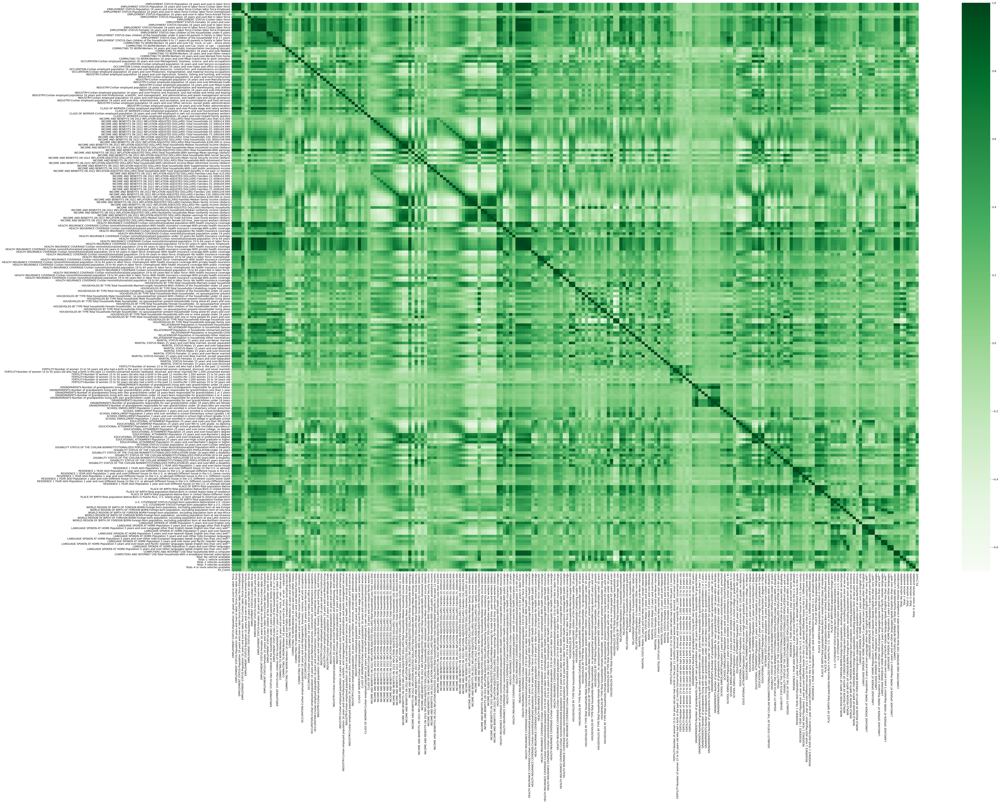

In [56]:
corr_matrix = evcountdata[evcountdata.columns[~evcountdata.columns.str.contains('County')]].corr()
plt.figure(figsize=(60,40))
sns.heatmap(corr_matrix, cmap = 'Greens')

# Model Prep

In [10]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [6]:
evcountdata = pd.read_csv('evcountdata.csv')

In [7]:
y = evcountdata['EV_Count']
X = evcountdata.drop('EV_Count', axis =1).astype(float)
X = X.fillna(0)
y = y.fillna(0)

## Models

These next sections use different modeling techinques to try and deal with this data. I use a few different metrics, namely r^2 and rmse, since prediction is important here; but I am also interesting in interpretability of these models, so I spend some time on that as we go on. I also tuned using parameters through Grid Search and fed the best parameters into the ultimate model. Through GridSearch, I also used five fold cross validation to preserve the efficacy of the data. 

# Linear Regression

We are going to start with linear regression, because that is always a good place to start. 

In [24]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns = X.columns.tolist())
X_scaled = X_scaled.set_index(X.index)

In [25]:
X_scaled = sm.add_constant(X_scaled)
#statsmodels, why are you like this?

I scaled this, so that the coefficients that were produced were more useful, since coefficients are on different scales, it is difficult to compare one to another if they are not on the same scale. So I regularized and scaled them. 

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.2)
# train test split

In [27]:
linreg = sm.OLS(y_train, X_train).fit()
# the actual linear regression

In [28]:
linreg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               EV_Count   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.664
Method:                 Least Squares   F-statistic:                     15.98
Date:                Thu, 29 Feb 2024   Prob (F-statistic):          9.39e-226
Time:                        10:35:36   Log-Likelihood:                -7784.6
No. Observations:                1416   AIC:                         1.595e+04
Df Residuals:                    1228   BIC:                         1.693e+04
Df Model:                         187                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================================================================================================================================
                                                                                                                                                                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                                                         93.8483      1.706     55.001      0.000      90.501      97.196
Geography                                                                                                                                                                     -2.2056      2.137     -1.032      0.302      -6.399       1.987
EMPLOYMENT STATUS-Population 16 years and over-In labor force                                                                                                                 -2.7987      9.738     -0.287      0.774     -21.905      16.307
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force                                                                                            -1.0755      7.127     -0.151      0.880     -15.058      12.907
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Employed                                                                                   -1.6667      7.197     -0.232      0.817     -15.786      12.453
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Unemployed                                                                                  5.7879      8.091      0.715      0.475     -10.086      21.662
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Armed Forces                                                                                                    -7.8945     14.089     -0.560      0.575     -35.536      19.747
EMPLOYMENT STATUS-Population 16 years and over-Not in labor force                                                                                                            -16.0603     34.411     -0.467      0.641     -83.571      51.451
EMPLOYMENT STATUS-Civilian labor force                                                                                                                                        -1.0755      7.127     -0.151      0.880     -15.058      12.907
EMPLOYMENT STATUS-Females 16 years and over                                                                                                                                  -31.2431     54.054     -0.578      0.563 

In [38]:
from math import sqrt
y_pred = linreg.predict(X_test)
var = sqrt(mean_squared_error(y_test, y_pred))
print("The RMSE is {}".format(var))

The RMSE is 62.297676594946694


On a predictive level, that's not particularly good. If the mean is 94, a +/- of 114 is functionally unusable, the estimates are just going to be way off. This has a prety good F-statistic though, so it is better than not doing the regression; there's something interesting in there. The adjusted R^2 is pretty good, so the model is definitely capturing something interesting; scanning through, it looks to me like some of the most significant variables are mean income and percentage married with kids.

# Decision Tree Regression

In [17]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

In [92]:
dtregress = DecisionTreeRegressor()

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [94]:
param_grid = {
    'max_depth': [1,2,3,4,5,6],
    'min_samples_split': [2,5,8,12,14],
    'min_samples_leaf':[1,2,3,4,5,6],
    'max_features': ['auto', 'sqrt', 'log2', None]
    
}

In [95]:
gsc = GridSearchCV(dtregress, param_grid, scoring = 'neg_mean_squared_error', cv = 5)
gsc.fit(X_train, y_train)

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
900 fits failed out of a total of 3600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
900 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\hilar\newanaconda\Lib\

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6],
                         'max_features': ['auto', 'sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6],
                         'min_samples_split': [2, 5, 8, 12, 14]},
             scoring='neg_mean_squared_error')

In [58]:
gsc.best_params_

{'max_depth': 5,
 'max_features': 'sqrt',
 'min_samples_leaf': 3,
 'min_samples_split': 5}

In [59]:
y_pred = gsc.best_estimator_.predict(X_test)

In [60]:
var = sqrt(mean_squared_error(y_test, y_pred))
print("The RMSE is {}".format(var))

The RMSE is 72.76974716426714


This worked somewhat better than linear regression. Let's test a few more models before going to dimensionality reduction.

# Support Vector Regression

This section uses support vector regression, and scales the data for going through a regression model. 

In [8]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns = X.columns.tolist())
X_scaled = X_scaled.set_index(X.index)
y_scaled = scaler.fit_transform(np.asarray(y).reshape(-1, 1))
# important to scale support vectors so that the model works; the actual sizes of the points can drastically influence the model otherwise

In [11]:
X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test = train_test_split(X_scaled, y_scaled, test_size = 0.2)

In [12]:
from sklearn.svm import SVR

In [13]:
svr = SVR()

In [14]:
y_scaled_train  = np.ravel(y_scaled_train)

In [15]:
param_grid = {
     'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.001, 0.01, 0.1, 1, 10],
    'epsilon': [0.1, 0.2, 0.5, 0.7, 0.8],
}

In [ ]:
gsc_svr = GridSearchCV(svr, param_grid, cv = 5, scoring = 'neg_mean_squared_error')
gsc_svr.fit(X_scaled_train, y_scaled_train)

In [ ]:
y_pred = gsc_svr.best_estimator_.predict(X_scaled_test)
#intriguing

In [ ]:
scaler_y = StandardScaler()
scaler_y.fit(np.asarray(y_train).reshape(-1,1))
# we gotta unscale this dude to make it understandable

In [ ]:
org_y_pred = scaler_y.inverse_transform(y_pred.reshape(-1, 1)).flatten()
org_y_test = scaler_y.inverse_transform(y_scaled_test.reshape(-1, 1)).flatten()
#unscaling

In [ ]:
print("The RMSE is {}".format(sqrt(mean_squared_error(org_y_test, org_y_pred))))

that seems to have improved things a lot, but this is somewhat less sensitive than we might want it to be; when the mean is this low, and mse like this is pretty high

# Random Forest Regression

this section uses a random forest model to try and predict the distribution of evs by census tract

In [8]:
from sklearn.ensemble import RandomForestRegressor

In [9]:
rfr = RandomForestRegressor()
#love random forest

In [10]:
param_grid = {
    'n_estimators':[100, 150],
     'max_depth': [4,5,6],
    'min_samples_split': [2,5,8],
    'min_samples_leaf':[1,2,3]
    
}

In [11]:
rfr_res = GridSearchCV(rfr, param_grid, cv = 5, scoring = 'neg_mean_squared_error').fit(X_train, y_train)

In [14]:
from math import sqrt
y_pred = rfr_res.best_estimator_.predict(X_test)
print(rfr_res.best_params_)

{'max_depth': 6, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 150}


In [15]:
print(sqrt(mean_squared_error(y_test, y_pred)))
#this iteration is somewhat worse than xgboost, but with more decision trees, could get it way down, so that's why it's my best model

42.523137984366784


In [18]:
rfinal = RandomForestRegressor(max_depth = 6, min_samples_leaf = 3, min_samples_split = 2, n_estimators = 150).fit(X_train, y_train)

# XGBoost Regression

this section fits an xg boost regression model to this dataset

In [98]:
from xgboost import XGBRegressor

In [99]:
xgb = XGBRegressor()

In [100]:
param_grid = {'n_estimators': [50],
              'max_depth': [2,4,6,8,10],
              'eta':[0.01, 0.1, 0.3, 0.5, 0.7],
              'colsample_bytree': [0.1, 0.4, 0.7, 0.8]
    
}

In [101]:
xgb_res = GridSearchCV(xgb, param_grid, cv = 5, scoring = 'neg_mean_squared_error').fit(X_train, y_train)

In [102]:
from math import sqrt
y_pred = xgb_res.best_estimator_.predict(X_test)
print(sqrt(mean_squared_error(y_test, y_pred)))

41.83524813927541


# ElasticNet Model

Since there are too many features here, we should try something with some dimensionality reduction to see if we get a better model or better categories. We'll start by using Elasticnet, which mixes l1 and l2 regularization to pick the best features for use in its model. 

In [42]:
from sklearn.linear_model import ElasticNet

In [43]:
param_grid = {"alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10],
              "l1_ratio": [0.1, 0.3, 0.5, 0.7, 0.9]
    
}

In [44]:
en = ElasticNet()

In [45]:
en_gs_mse = GridSearchCV(en, param_grid, cv = 5, scoring = 'neg_mean_squared_error').fit(X_train, y_train)
en_gs_r2 = GridSearchCV(en, param_grid, cv = 5, scoring = 'r2').fit(X_train, y_train)

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.237e+06, tolerance: 1.514e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.274e+06, tolerance: 1.406e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.408e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.379e+06, tolerance: 1.547e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.238e+06, tolerance: 1.514e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.275e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.008e+05, tolerance: 1.125e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.379e+06, tolerance: 1.547e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.242e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.409e+06, tolerance: 1.461e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.011e+05, tolerance: 1.125e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.380e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.283e+06, tolerance: 1.406e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.413e+06, tolerance: 1.461e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.023e+05, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.265e+06, tolerance: 1.514e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.301e+06, tolerance: 1.406e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.430e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.513e+06, tolerance: 1.547e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.396e+06, tolerance: 1.514e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.408e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.408e+06, tolerance: 1.461e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.008e+05, tolerance: 1.125e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.379e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.275e+06, tolerance: 1.406e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.408e+06, tolerance: 1.461e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.009e+05, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.240e+06, tolerance: 1.514e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.277e+06, tolerance: 1.406e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.410e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.384e+06, tolerance: 1.547e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.247e+06, tolerance: 1.514e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.284e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.041e+05, tolerance: 1.125e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.389e+06, tolerance: 1.547e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.263e+06, to

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.504e+06, tolerance: 1.461e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.203e+05, tolerance: 1.125e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.495e+06, to

I want two models, one for predictive ability, and another one that gets at how much of the variance of the data is reflected in the model; the r^2 one might have more explanatory power. 

In [46]:
y_pred = en_gs_mse.best_estimator_.predict(X_test)
sqrt(mean_squared_error(y_test, y_pred))

46.144770381827385

In [47]:
from math import sqrt
y_pred = en_gs_r2.best_estimator_.predict(X_test)
sqrt(mean_squared_error(y_test, y_pred))

46.144770381827385

when optimizing parameters for R^2 vs. mse, there is really no differenence in terms of predictive ability. 

In [48]:
en_gs_mse.best_params_

{'alpha': 10, 'l1_ratio': 0.9}

In [49]:
en = ElasticNet(alpha = 10, l1_ratio =0.9)
mod = en.fit(X_train, y_train)

C:\Users\hilar\newanaconda\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.834e+06, tolerance: 1.764e+03
  model = cd_fast.enet_coordinate_descent(


these results help us figure out which elasticnet features to use---and if we can port these over to a poisson or an ols

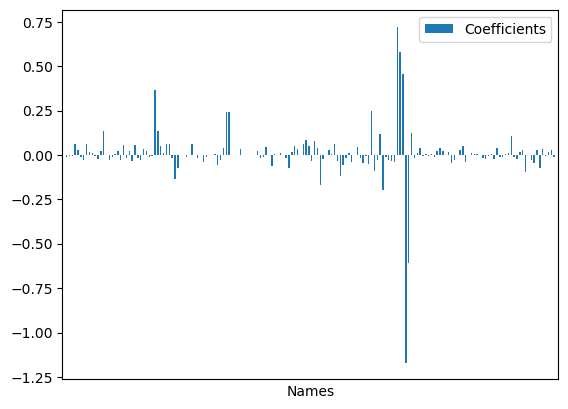

In [50]:
coefficients = mod.coef_
intercept = mod.intercept_
results = pd.DataFrame(mod.feature_names_in_, coefficients).reset_index()
results.columns = ['Coefficients', 'Names']
results = results.set_index('Names')
results = results[abs(results.Coefficients) > 0] #because of l1/l2 regularization, we can filter these out, because they are not really adding a ton of interpretive value
results.plot(kind = 'bar')
plt.xticks([])
plt.show()

There's still a lot of columns here, and I will port these over to an ols and a poisson to see if we can get something more effective from it; however, let's just look closely at some of those big coefficients.

# Linear Regression Redux

In [53]:
from sklearn.preprocessing import StandardScaler
l2data = evcountdata[evcountdata.columns[evcountdata.columns.isin(results.index)].drop('Geography')]
X = l2data
X = X.fillna(0)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns = X.columns.tolist())
X_scaled = X_scaled.set_index(X.index)

In [54]:
X_scaled = sm.add_constant(X_scaled)

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.2)
# train test split

In [56]:
lr = sm.OLS(y_train, X_train).fit()

In [57]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               EV_Count   R-squared:                       0.701
Model:                            OLS   Adj. R-squared:                  0.663
Method:                 Least Squares   F-statistic:                     18.29
Date:                Sat, 02 Mar 2024   Prob (F-statistic):          2.13e-235
Time:                        20:18:00   Log-Likelihood:                -7813.6
No. Observations:                1416   AIC:                         1.595e+04
Df Residuals:                    1254   BIC:                         1.680e+04
Df Model:                         161                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================================================================================================================================
                                                                                                                                                                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                                                         94.7966      1.728     54.874      0.000      91.407      98.186
EMPLOYMENT STATUS-Population 16 years and over-In labor force                                                                                                                -28.3209     24.815     -1.141      0.254     -77.005      20.363
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force                                                                                           -26.5094     23.562     -1.125      0.261     -72.736      19.717
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Employed                                                                                  -28.3816     24.491     -1.159      0.247     -76.430      19.667
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Unemployed                                                                                  8.8038      7.589      1.160      0.246      -6.085      23.692
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Armed Forces                                                                                                    -8.1378     10.303     -0.790      0.430     -28.350      12.074
EMPLOYMENT STATUS-Population 16 years and over-Not in labor force                                                                                                            -32.4441     34.134     -0.950      0.342     -99.410      34.522
EMPLOYMENT STATUS-Females 16 years and over                                                                                                                                   -9.4951     46.023     -0.206      0.837     -99.785      80.795
EMPLOYMENT STATUS-Females 16 years and over-In labor force-Civilian labor force-Employed                                                                                      28.1800     10.707      2.632      0.009       7.174      49.186
EMPLOYMENT STATUS-Own children of the householder 6 to 17 years                                                                                                               19.4647     13.399      1.453      0.147 

In [58]:
y_pred = lr.predict(X_test)
var = sqrt(mean_squared_error(y_test, y_pred))
print("The RMSE is {}".format(var))

The RMSE is 55.83265960342251


So this was a somewhat fruitless exercise, but we have hopefully created the conditions for trying this out with a poisson; since this is count data, and that tends to be the best format. 

# Poisson Model

In [73]:
poisson_model = sm.Poisson(y_train, X_train).fit()
y_pred = poisson_model.predict(X_test)
var = sqrt(mean_squared_error(y_test, y_pred))
print("The RMSE is {}".format(var))

         Current function value: 9.973583
         Iterations: 35
The RMSE is 61.00352862989638


C:\Users\hilar\newanaconda\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [87]:
from scipy.stats import chi2
pearson_chi2_stat = np.sum((poisson_model.resid_pearson)**2)

# Calculate degrees of freedom
df = len(X_train) - poisson_model.df_model - 1

# Calculate p-value
p_value = 1 - chi2.cdf(pearson_chi2_stat, df)
print(p_value)

0.0


We used a chi2 test on the model to test if it was overdispersed. This result suggests that it is probably overdispersed and we need to move to a Negative Binomial model, despite the very good performance of the Poisson.

In [88]:
poisson_model = sm.NegativeBinomial(y_train, X_train).fit()
y_pred = poisson_model.predict(X_test)
var = sqrt(mean_squared_error(y_test, y_pred))
print("The RMSE is {}".format(var))

         Current function value: 4.698851
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39
The RMSE is 107.91124068382953


C:\Users\hilar\newanaconda\Lib\site-packages\scipy\optimize\_optimize.py:1359: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(f, x0, args, fprime, callback=callback, **opts)
C:\Users\hilar\newanaconda\Lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
C:\Users\hilar\newanaconda\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [89]:
poisson_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:               EV_Count   No. Observations:                 1416
Model:               NegativeBinomial   Df Residuals:                     1254
Method:                           MLE   Df Model:                          161
Date:                Sat, 02 Mar 2024   Pseudo R-squ.:                  0.1538
Time:                        20:32:51   Log-Likelihood:                -6653.6
converged:                      False   LL-Null:                       -7863.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
==============================================================================================================================================================================================================================================
                                                                                                                                                                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                                                          4.1355        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Population 16 years and over-In labor force                                                                                                                 -0.3074        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force                                                                                            -0.3139        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Employed                                                                                   -0.3285        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Unemployed                                                                                  0.0199        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Armed Forces                                                                                                     0.0314        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Population 16 years and over-Not in labor force                                                                                                             -0.1731        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Females 16 years and over                                                                                                                                   -0.0169        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Females 16 years and over-In labor force-Civilian labor force-Employed                                                                                       0.0915        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Own children of the householder 6 to 17 years                                                                                                                0.0688        nan        nan        nan         nan         nan
EMPLOYMENT STATUS-Own children of the householder 6 to 17 years-All parents in family in labor force                                  

This is pretty interesting, but difficult to interpret. 

# Analyzing the Most Effective Models for Results

The most effective model was a random forest model, which had a RMSE of around 36, so let's focus on that for our analysis.

In [24]:
feats = rfinal.feature_importances_

In [27]:
res = pd.DataFrame(zip(rfinal.feature_names_in_, feats))

In [28]:
res.columns = ['Names', 'Features']

Text(0.5, 1.0, 'Factors with relatively high feature importance')

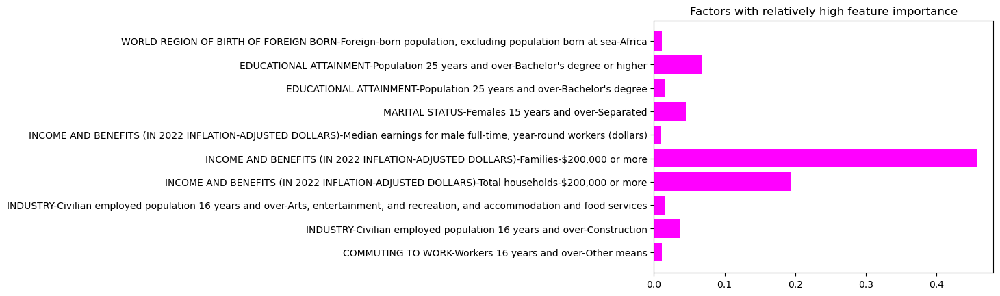

In [37]:
plt.barh(res[res['Features'] > 0.01]['Names'], res[res['Features'] > 0.01]['Features'], color = 'magenta')
plt.title('Factors with relatively high feature importance')

This Random Forest model is pretty great; it can predict ev counts in a census tract with only an error of around 30-40 or so, which  is honestly, extremely impressive. This would actually be pretty useful for policymakers both in the utility and the political space, as it would help them think about where evs are likely to go, and what kinds of infrastructure and other needs might be necessary to service this growing ev market. 

For Random Forest, part of the issue is that it is not easy to interpret; this chart represents the most important features that are larger than 1 percent in all of the different decision trees that are grown, so we can speculate a bit about the causality and what has the most predictive power. The most predictive feature for ev count is families that make over $200,000 dollars in a census tract; this suggests that higher incomes currently correlate strongly with ev adoption. In the same vein, educational attainment and higher median earnings are probably positive correlations with ev counts. There's no direct evidene for this, but construction, service industries, and female separation are all potentially correlates with lower income census tracts, and that is their function here. So this model suggests a very strong correlation between income and ev adoption. 

While we can use random forest to forecast effectively, that is not the entire goal of this project; we also want to do some explanation too, so let's pull in the linear regression from above to try and look at causality, and for ease of reference, we will focus specifically on factors with high p-values, which can help us cut a bit through all of the noise in the model. These types of models are so useful because it allows us to understand causality in a much more straightforward way.  

# LR Interpretation

Our most interpretable model is a linear regression, which is the beneficary of some dimensionality reduction, due to our usage of an ElasticNet algorithm to identify which factors are worth keeping.

In [90]:
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               EV_Count   R-squared:                       0.701
Model:                            OLS   Adj. R-squared:                  0.663
Method:                 Least Squares   F-statistic:                     18.29
Date:                Sat, 02 Mar 2024   Prob (F-statistic):          2.13e-235
Time:                        20:43:50   Log-Likelihood:                -7813.6
No. Observations:                1416   AIC:                         1.595e+04
Df Residuals:                    1254   BIC:                         1.680e+04
Df Model:                         161                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================================================================================================================================
                                                                                                                                                                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                                                         94.7966      1.728     54.874      0.000      91.407      98.186
EMPLOYMENT STATUS-Population 16 years and over-In labor force                                                                                                                -28.3209     24.815     -1.141      0.254     -77.005      20.363
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force                                                                                           -26.5094     23.562     -1.125      0.261     -72.736      19.717
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Employed                                                                                  -28.3816     24.491     -1.159      0.247     -76.430      19.667
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Civilian labor force-Unemployed                                                                                  8.8038      7.589      1.160      0.246      -6.085      23.692
EMPLOYMENT STATUS-Population 16 years and over-In labor force-Armed Forces                                                                                                    -8.1378     10.303     -0.790      0.430     -28.350      12.074
EMPLOYMENT STATUS-Population 16 years and over-Not in labor force                                                                                                            -32.4441     34.134     -0.950      0.342     -99.410      34.522
EMPLOYMENT STATUS-Females 16 years and over                                                                                                                                   -9.4951     46.023     -0.206      0.837     -99.785      80.795
EMPLOYMENT STATUS-Females 16 years and over-In labor force-Civilian labor force-Employed                                                                                      28.1800     10.707      2.632      0.009       7.174      49.186
EMPLOYMENT STATUS-Own children of the householder 6 to 17 years                                                                                                               19.4647     13.399      1.453      0.147 

These linear regression coefficients were standardized and scaled so that they could be compared; it means that functionally the y for a particular tract increases by this for a one unit increase in this factor while holding all other factors constant. Instead of going into a ton of detail about each one (there's things in here that are both confusing and contradictory, and it would require more intense analytical work to tease out the obvious causal problems), I'm just going to look at some of the more significant and interesting outcomes here and which direction they influence the ev count. Since we've done a lot of work on this, our prior for the p-value should be pretty low, so probably at least 0.01 or less. 

Some strong positive correlates are: 

    -EMPLOYMENT STATUS-Females 16 years and over-In labor force-Civilian labor force-Employed
    -COMMUTING TO WORK-Workers 16 years and over-Other means
    -INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-Mean household income (dollars)
    -INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Families-150,000𝑡𝑜199,999
    -INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Families-$200,000 or more
    -FERTILITY-Number of women 15 to 50 years old who had a birth in the past 12 months

Some strong negative correlates are:    
    
    -INDUSTRY-Civilian employed population 16 years and over-Educational services, and health care and social assistance
    -INCOME AND BENEFITS (IN 2022 INFLATION-ADJUSTED DOLLARS)-Total households-With Social Security-Mean Social Security income (dollars)
    -HOUSEHOLDS BY TYPE-Total households-Male householder, no spouse/partner present-Householder living alone-65 years and over
    -LANGUAGE SPOKEN AT HOME-Population 5 years and over-Other Indo-European languages-Speak English less than very well"
    -FERTILITY-Number of women 15 to 50 years old who had a birth in the past 12 months-Unmarried women (widowed, divorced, and never married) 	


The core story here continues to be income; more female employment is probably a proxy for dual income couples; not sure what the story is with other means and commuting, but the strongest correlates are income. Negative correlates are some industries with slightly less money in a tract, as well as the amount of social security a household is taking in, and single adult households, as well as non-english speakers/immigrants. 

# Conclusion

This project has set out to use the Washington State ev count datset and divide it up by census tract to look at the features of tracts with more evs. This has pretty important implications for policy, since forecasting ev demand and uptick is an important policy and infrastructural problem for stakeholders like utilities, cities, and local governments. This analysis built out a usable dataset, explored it, and put some models together to forecast it, using a random forest in particular for the best accuracy. This analysis identified income as a highly important variable in identifying where evs are most prominent. An enterprising analyst could generalize from this model to other states, which have the same dataset, but may not have such detailed count data. There are lots of useful applications, including tracking the changing factors that predict the next tier of ev adoption, as the acs updates, all of which are of some use as the electric vehicle transition takes place. 